<a href="https://colab.research.google.com/github/deidei1210/Music-Emotion-Recognition/blob/master/Music_Emotion_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import IPython
import librosa
import librosa.display
import soundfile as sf

In [3]:
# prompt: 播放mp3文件

filename = '/content/星星在唱歌.mp3'

data, sr = librosa.load(filename)
IPython.display.Audio(data, rate=sr)


In [4]:
# 截取音频的一部分（示例：前5秒）
start_time = 25
end_time = 53
start_sample = int(start_time * sr)
end_sample = int(end_time * sr)
y_trimmed = data[start_sample:end_sample]

# 保存截取后的音频文件
output_path = 'trimmed_audio.wav'
sf.write(output_path, y_trimmed, sr)

data1, sr = librosa.load("/content/trimmed_audio.wav")
IPython.display.Audio(data1, rate=sr)

# 绘制波形图

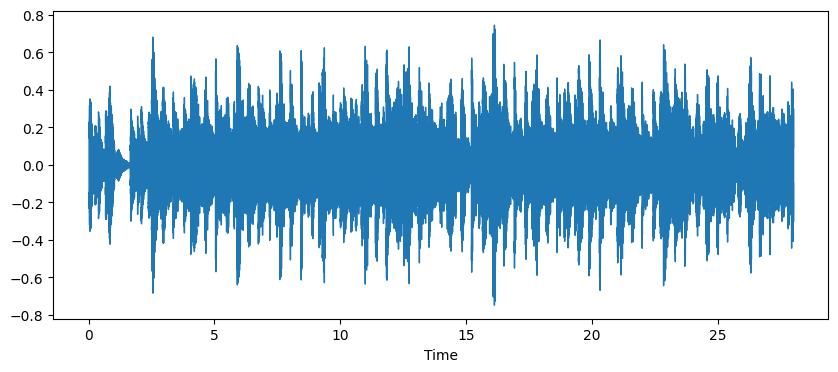

In [5]:
fig = plt.figure(figsize=(10, 4))
librosa.display.waveshow(data1)
plt.show()

# 梅尔频谱

信号的梅尔频率倒谱系数（MFCCs）是一组小型特征（通常约为10-20个），简洁描述了频谱包络的整体形状。在音乐信息检索（MIR）中，它经常用于描述音色。

在声音处理中，梅尔频率倒谱（MFC）是声音短时功率谱的表示，基于频率的非线性梅尔刻度上的对数功率谱的线性余弦变换。

有用的链接：

https://en.wikipedia.org/wiki/Mel-frequency_cepstrum


https://musicinformationretrieval.com/mfcc.html

In [6]:
MFCC1 = librosa.feature.mfcc(y=data1, sr=sr, n_fft=4096, hop_length=256, n_mfcc=40)

In [7]:
MFCC1.shape #输入音频的MFCC特征矩阵

(40, 2412)

Text(0.5, 1.0, 'Star is singing')

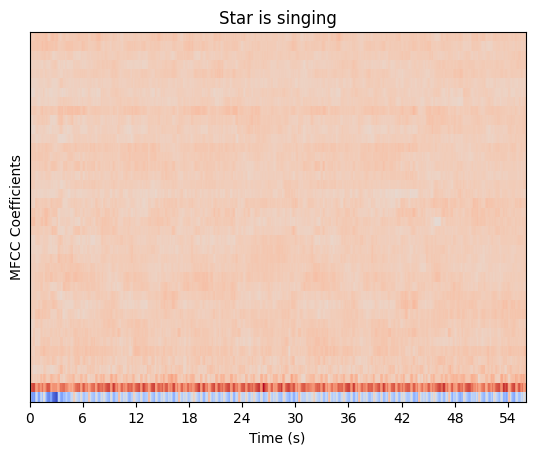

In [8]:
# fig = plt.figure(figsize=(20,10))

# plt.subplot(2, 3, 1)
librosa.display.specshow(MFCC1, sr=sr, x_axis='time')
plt.xlabel("Time (s)")
plt.ylabel("MFCC Coefficients")
plt.title("Star is singing")

## MFCC特征放缩

特征缩放是指对MFCC（Mel频率倒谱系数）进行缩放处理，使得每个系数的维度均值为零，方差为一。这样做的目的是为了让不同维度之间的特征在参与模型训练时具有相近的重要性，避免某些维度的特征值范围过大对模型产生不利影响。

In [9]:
import sklearn
from sklearn import preprocessing

MFCC = preprocessing.scale(MFCC1, axis=1)
print(MFCC.mean(axis=1))
print(MFCC.var(axis=1))

[ 6.3261978e-09 -1.4233945e-08 -9.4892965e-09  0.0000000e+00
  0.0000000e+00  6.3261978e-09  9.4892965e-09  1.2652396e-08
  0.0000000e+00 -1.2652396e-08 -1.2652396e-08  6.3261978e-09
  1.2652396e-08  2.5304791e-08  0.0000000e+00 -1.2652396e-08
  1.2652396e-08 -1.2652396e-08  6.3261978e-09 -6.3261978e-09
  0.0000000e+00  6.3261978e-09  1.2652396e-08  6.3261978e-09
  9.4892965e-09  0.0000000e+00 -6.3261978e-09 -6.3261978e-09
 -6.3261978e-09  6.3261978e-09  6.3261978e-09  0.0000000e+00
  3.1630989e-09  0.0000000e+00  6.3261978e-09  3.1630989e-09
  0.0000000e+00 -3.1630989e-09  1.2652396e-08  0.0000000e+00]
[1.0000001 1.        1.0000001 0.9999999 1.        1.        1.
 1.        0.9999999 1.        1.        1.0000001 1.0000001 1.
 1.        1.        1.        1.        1.0000001 1.        1.
 0.9999999 0.9999998 0.9999998 1.        0.9999998 1.        1.
 1.        1.        1.        1.        1.        1.        1.
 1.        1.0000001 1.        0.9999998 1.       ]


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_data.py:240: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_data.py:259: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn(


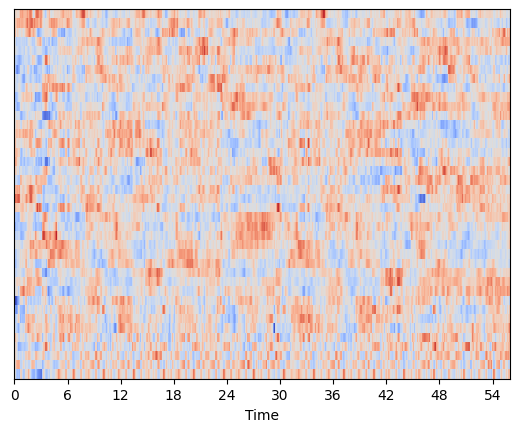

In [10]:
librosa.display.specshow(MFCC, sr=sr, x_axis='time')

# 过零率

过零率表示信号穿过水平轴的次数。

过零率（ZCR）是指信号从正变为零再到负，或者从负变为零再到正的速率。它的值在语音识别和音乐信息检索中被广泛使用，是对敲击声音进行分类的关键特征。

有用的链接：

https://en.wikipedia.org/wiki/Zero-crossing_rate
https://musicinformationretrieval.com/zcr.html

这个计算会生成一个二进制掩码，其中 True 表示存在零穿越

In [11]:
zero_crossings = librosa.zero_crossings(data1, pad=False)

In [12]:
zero_crossings

array([False, False, False, ..., False, False, False])

In [13]:
print(zero_crossings.sum(), " : sum")  #返回所有穿越零点的总数
print(zero_crossings.shape, " : shape") #数组的维度

39120  : sum
(617400,)  : shape


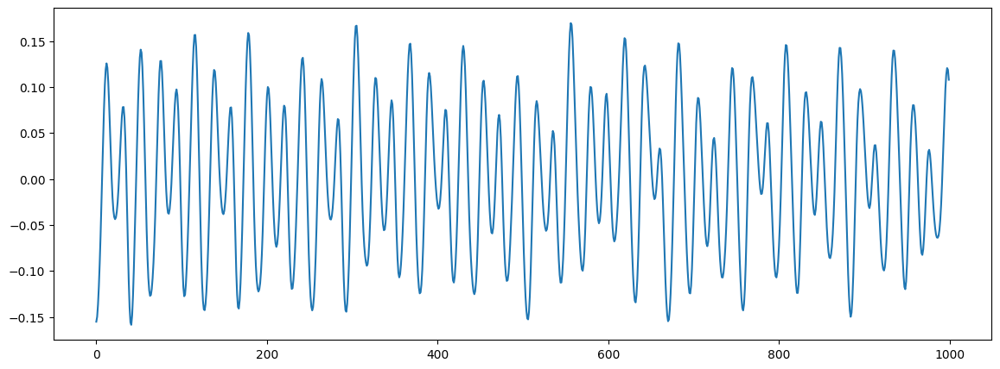

In [14]:
n0 = 6500 #起始的采样点
n1 = 7500 #结束的采样点
plt.figure(figsize=(14, 5))
plt.plot(data1[n0:n1])

# 色度短时傅里叶变换（Chroma STFT）

一个色度向量通常是一个包含12个元素的特征向量，指示信号中每个音高类别{C, C#, D, D#, E, ..., B}的能量分布情况。

Chroma图用来表示音频中的音调特征。具体来说，Chroma图展示了在音频信号中不同音调（音高）的相对强度或能量分布情况，通常是指12个半音组成的音调类别。

Chroma图在音乐信息检索、音频分类和音乐推荐等领域中非常有用。通过分析Chroma图，我们可以识别和区分不同音乐曲目之间的音调特征，从而实现音频内容的自动识别、分类和相似性比较。这对于音乐搜索引擎、音乐推荐系统以及音乐理论研究都具有重要意义。


有用的链接：
https://librosa.org/doc/main/generated/librosa.feature.chroma_stft.html

In [15]:
# Using an energy (magnitude) spectrum instead of power spectrogram
S1 = np.abs(librosa.stft(data1))
chroma_stft1 = librosa.feature.chroma_stft(S=S1, sr=sr)

# Using a pre-computed power spectrogram with a larger frame
S2 = np.abs(librosa.stft(data1, n_fft=4096))**2
chroma_stft2 = librosa.feature.chroma_stft(S=S2, sr=sr)

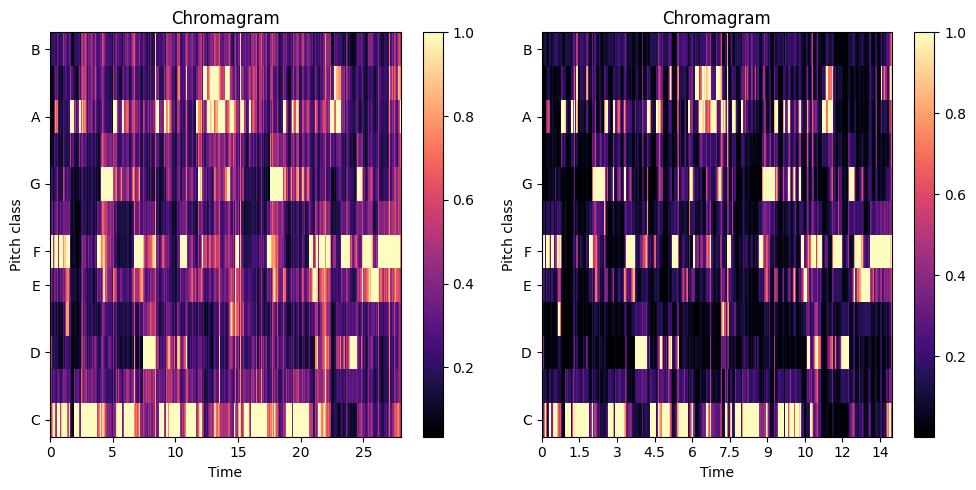

In [16]:
fig = plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
librosa.display.specshow(chroma_stft1, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram')

plt.subplot(1, 2, 2)
librosa.display.specshow(chroma_stft2, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram')
plt.tight_layout()

# 均方根(RMS)
一种用来衡量信号能量或振幅的指标。在信号处理中，RMS 值代表信号的有效值，即信号波形的振幅的均方根值。

对于音频信号来说，RMS 值通常被用来衡量信号的整体响度或音量大小。通过计算信号的 RMS 值，我们可以了解到信号的能量分布情况，从而判断信号的相对响度。

在实际应用中，RMS 值常常被用来作为音频处理和分析的重要参数，帮助我们调节音频信号的音量、动态范围等属性。通过比较不同信号的 RMS 值，我们可以进行音频质量评估、音量匹配等操作。

总之，RMS 是一种常用的信号处理指标，用于描述信号的振幅或能量特征，尤其在音频领域具有重要意义。

有用链接：
https://librosa.org/doc/main/generated/librosa.feature.rms.html
演奏音符通常伴随着信号能量的突然增加。为了检测这种突然增加，我们将计算一个能量新颖性函数：

* 计算信号的短时能量。
* 计算能量的一阶差分。
* 对一阶差分进行半波整流处理。

In [18]:
#表示相邻两个分析窗口之间的时间间隔，即帧移。在这里，每次移动 256 个样本点。
hop_length = 256
#表示每个分析窗口的长度，即帧长。在这里，每个窗口包含 100 个样本点。
frame_length = 100
#abs(data1[i: i + frame_length] ** 2) 用于计算每个窗口内数据的绝对值平方，即能量。
#在计算信号能量时，我们通常使用信号的幅值的平方来表示每个样本点的能量，即 ( |x[n]|^2 )。这是因为信号的功率与信号的幅值的平方成正比，
#所以在离散信号处理中，我们常用幅值的平方来表示信号的能量。
energy = np.array([sum(abs(data1[i: i + frame_length] ** 2)) for i in range(0, len(data1), hop_length)])

In [19]:
energy.shape

(2412,)

In [20]:
rmse = librosa.feature.rms(y=data1, frame_length=frame_length, hop_length=hop_length, center=True)
rmse = rmse[0]
frames = range(len(energy))
t = librosa.frames_to_time(frames, sr=sr, hop_length=hop_length)
rmse_diff = np.zeros_like(rmse)
rmse_diff[1:] = np.diff(rmse)
energy_novelty = np.max([np.zeros_like(rmse_diff), rmse_diff], axis=0)

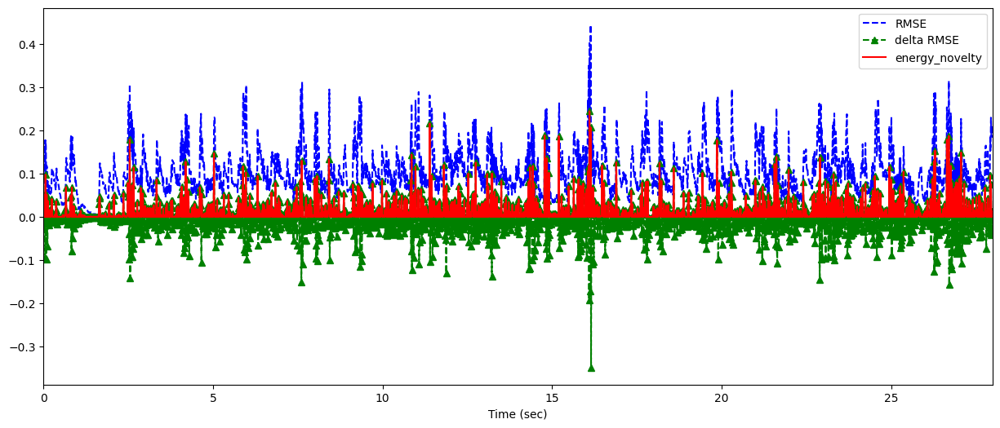

In [21]:
plt.figure(figsize=(15, 6))
plt.plot(t, rmse, 'b--', t, rmse_diff, 'g--^', t, energy_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('RMSE', 'delta RMSE', "energy_novelty"))
plt.show()

# 梅尔频谱图（Mel Spectrogram）

梅尔频谱图（Mel Spectrogram）是一种将频率转换为梅尔刻度（mel scale）的频谱图。梅尔刻度是根据声音在听觉系统中的感知方式而设计的单位，使得在梅尔刻度上等距离的频率在听觉上听起来也是等距离的。

通过将频率转换为梅尔刻度，梅尔频谱图能更好地模拟人类听觉系统对声音的感知方式，对音频信号进行特征提取和分析时具有重要意义。

如果你想了解如何使用 Python 中的 Librosa 库生成梅尔频谱图，可以参考下面的链接：

Understanding the Mel Spectrogram
https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53

Librosa - librosa.feature.melspectrogram
https://librosa.org/doc/main/generated/librosa.feature.melspectrogram.html


In [22]:
spec = librosa.feature.melspectrogram(y=data1, sr=sr)

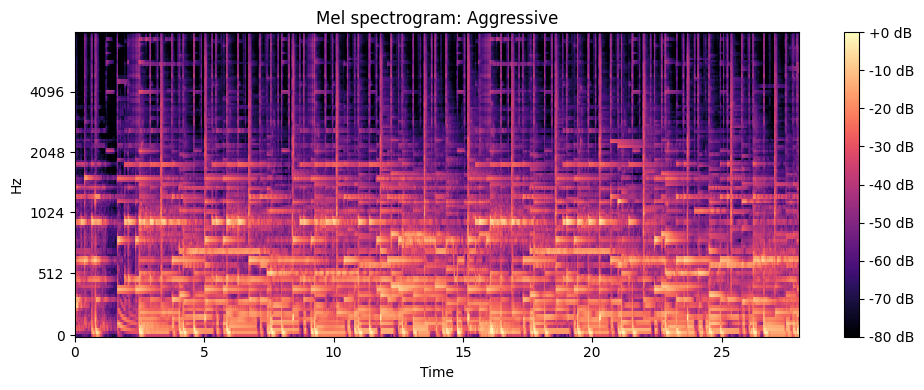

In [23]:
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.power_to_db(spec, ref=np.max),
                          y_axis='mel', fmax=8000,
                          x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel spectrogram')
plt.tight_layout()